# Importing the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option('display.max_columns', 22)
pd.set_option('display.max_rows', 3000)
df = pd.read_csv('Life Expectancy Data.csv')

In [3]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


# EDA

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [5]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


## Renaming the column names

In [6]:
orig_cols = list(df.columns)
new_cols = []
for col in orig_cols:
    new_cols.append(col.strip().replace('  ', ' ').replace(' ', '_').lower())
df.columns = new_cols

In [7]:
grouped_df = df.groupby(by='country').mean()
grouped_df

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling
country,,,,,,,,,,,,,,,,,,,,
Afghanistan,2007.5,58.19375,269.0625,78.2500,0.014375,34.960110,64.562500,2362.2500,15.51875,107.5625,48.375000,8.252500,52.312500,0.10000,340.015425,9.972260e+06,16.58125,15.58125,0.415375,8.21250
Albania,2007.5,75.15625,45.0625,0.6875,4.848750,193.259091,98.000000,53.3750,49.06875,0.9375,98.125000,5.945625,98.062500,0.10000,2119.726679,6.969116e+05,1.61875,1.70000,0.709875,12.13750
Algeria,2007.5,73.61875,108.1875,20.3125,0.406667,236.185241,78.000000,1943.8750,48.74375,23.5000,91.750000,4.604000,91.875000,0.10000,2847.853392,2.164983e+07,6.09375,5.97500,0.694875,12.71250
Angola,2007.5,49.01875,328.5625,83.7500,5.740667,102.100268,70.222222,3561.3125,18.01875,132.6250,46.125000,3.919333,47.687500,2.36875,1975.143045,1.014710e+07,6.19375,6.66875,0.458375,8.04375
Antigua and Barbuda,2007.5,75.05625,127.5000,0.0000,7.949333,1001.585226,98.266667,0.0000,38.42500,0.0000,96.937500,4.791333,98.312500,0.12500,9759.305728,NaN,3.42500,3.37500,0.488625,8.84375
Argentina,2007.5,75.15625,106.0000,10.1250,7.966667,773.038981,81.285714,2.0000,54.98125,11.3750,93.375000,6.912667,92.375000,0.10000,6998.575103,2.012120e+07,1.07500,0.95000,0.794125,16.50625
Armenia,2007.5,73.40000,117.3750,1.0000,3.702667,131.007419,87.562500,274.2500,44.70625,1.0000,89.125000,4.861333,87.375000,0.10000,1999.986318,1.015165e+06,2.03750,2.11250,0.698375,11.78750
Australia,2007.5,81.81250,63.1875,1.0000,10.155333,5332.226473,93.400000,103.9375,55.86250,1.3750,86.750000,8.836667,86.875000,0.10000,34637.565047,4.587010e+06,0.66875,0.62500,0.918125,20.03750
Austria,2007.5,81.48125,65.7500,0.0000,12.236000,4928.439188,81.062500,77.2500,48.28750,0.0000,86.000000,4.715333,86.750000,0.10000,33827.476309,6.474880e+06,1.73125,1.93750,0.862375,15.38750


<BarContainer object of 16 artists>

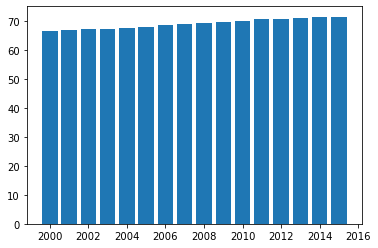

In [8]:
plt.bar(df.groupby('year')['year'].count().index,df.groupby('year')['life_expectancy'].mean())

With time life expectancy got increased

Text(0, 0.5, 'Avg Life_Expectancy')

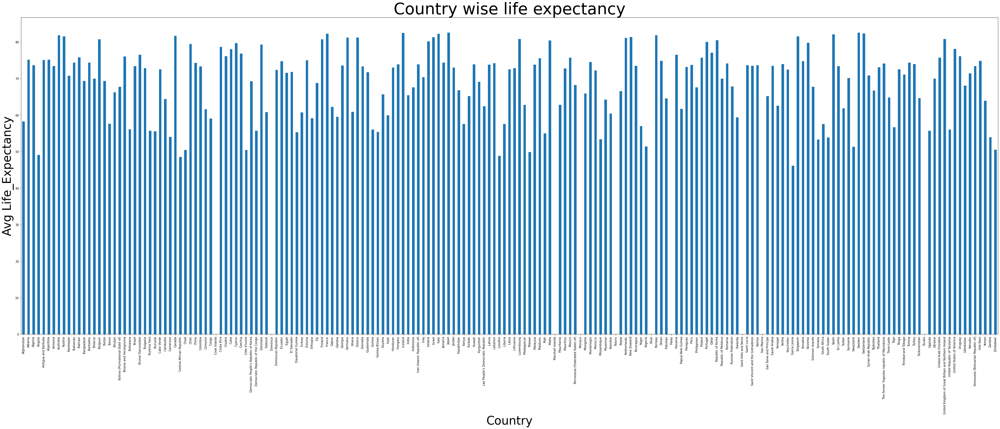

In [9]:
grouped_df['life_expectancy'].plot(kind='bar', figsize=(60,20))
plt.title("Country wise life expectancy",fontsize=55)
plt.xlabel("Country",fontsize=40)
plt.ylabel("Avg Life_Expectancy",fontsize=40)

Text(0, 0.5, 'Avg GDP')

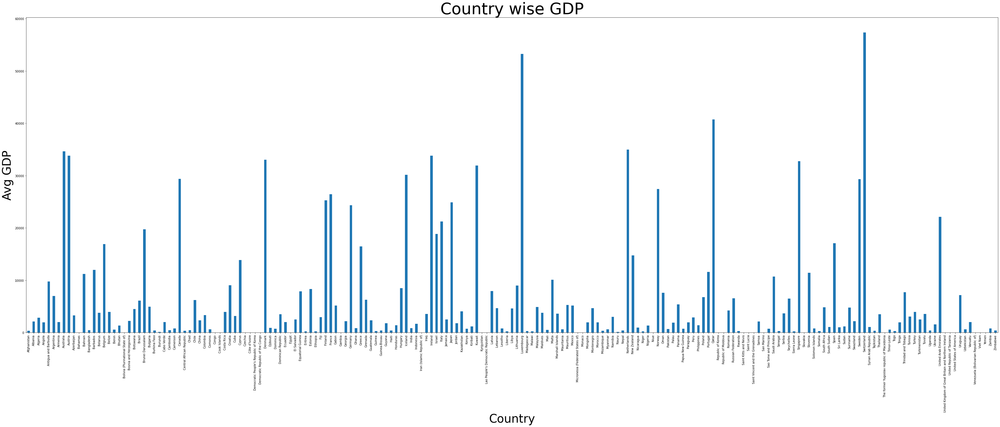

In [10]:
grouped_df['gdp'].plot(kind='bar', figsize=(60,20))
plt.title("Country wise GDP",fontsize=55)
plt.xlabel("Country",fontsize=40)
plt.ylabel("Avg GDP",fontsize=40)

Text(0, 0.5, 'Avg population')

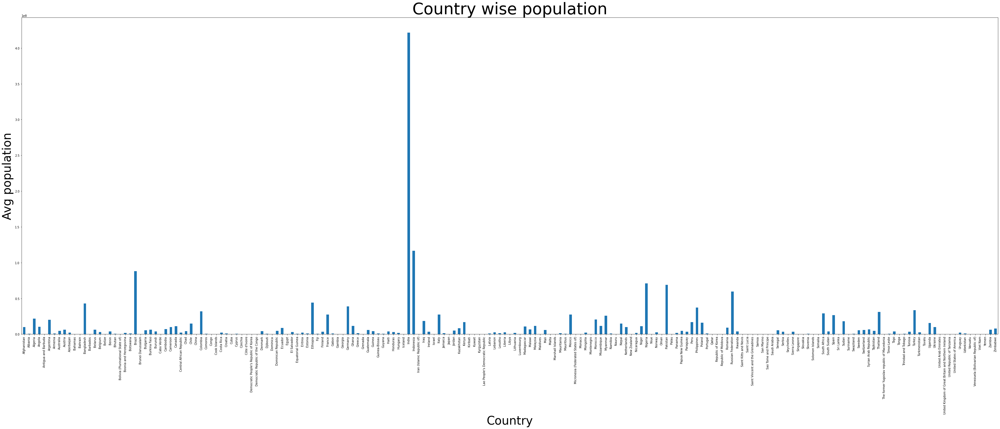

In [11]:
grouped_df['population'].plot(kind='bar', figsize=(60,20))
plt.title("Country wise population",fontsize=55)
plt.xlabel("Country",fontsize=40)
plt.ylabel("Avg population",fontsize=40)

# Data preprocessing

In [12]:
df['country'].value_counts()

Uruguay                                                 16
Swaziland                                               16
Philippines                                             16
Bosnia and Herzegovina                                  16
Madagascar                                              16
Indonesia                                               16
Benin                                                   16
Montenegro                                              16
Angola                                                  16
Lesotho                                                 16
Belarus                                                 16
Israel                                                  16
Antigua and Barbuda                                     16
Jordan                                                  16
Czechia                                                 16
Egypt                                                   16
Rwanda                                                  

Tuvalu, Marshall Islands, Dominica, Monaco, San Marino, Niue, Saint Kitts and Nevis, Cook Islands, Palau, Nauru these countries have record of one year only, So we can drop the rows

In [13]:
df = df[df.country != 'Saint Kitts and Nevis']
df = df[df.country != 'Dominica']
df = df[df.country != 'Palau']
df = df[df.country != 'Monaco']
df = df[df.country != 'Tuvalu']
df = df[df.country != 'Niue']
df = df[df.country != 'Marshall Islands']
df = df[df.country != 'San Marino']
df = df[df.country != 'Cook Islands']
df = df[df.country != 'Nauru']

## Handling missing values

In [14]:
df.isnull().sum()

country                              0
year                                 0
status                               0
life_expectancy                      0
adult_mortality                      0
infant_deaths                        0
alcohol                            193
percentage_expenditure               0
hepatitis_b                        553
measles                              0
bmi                                 32
under-five_deaths                    0
polio                               19
total_expenditure                  226
diphtheria                          19
hiv/aids                             0
gdp                                443
population                         644
thinness_1-19_years                 32
thinness_5-9_years                  32
income_composition_of_resources    160
schooling                          160
dtype: int64

In [15]:
df.isnull().sum() / len(df) * 100

country                             0.000000
year                                0.000000
status                              0.000000
life_expectancy                     0.000000
adult_mortality                     0.000000
infant_deaths                       0.000000
alcohol                             6.591530
percentage_expenditure              0.000000
hepatitis_b                        18.886612
measles                             0.000000
bmi                                 1.092896
under-five_deaths                   0.000000
polio                               0.648907
total_expenditure                   7.718579
diphtheria                          0.648907
hiv/aids                            0.000000
gdp                                15.129781
population                         21.994536
thinness_1-19_years                 1.092896
thinness_5-9_years                  1.092896
income_composition_of_resources     5.464481
schooling                           5.464481
dtype: flo

<AxesSubplot:>

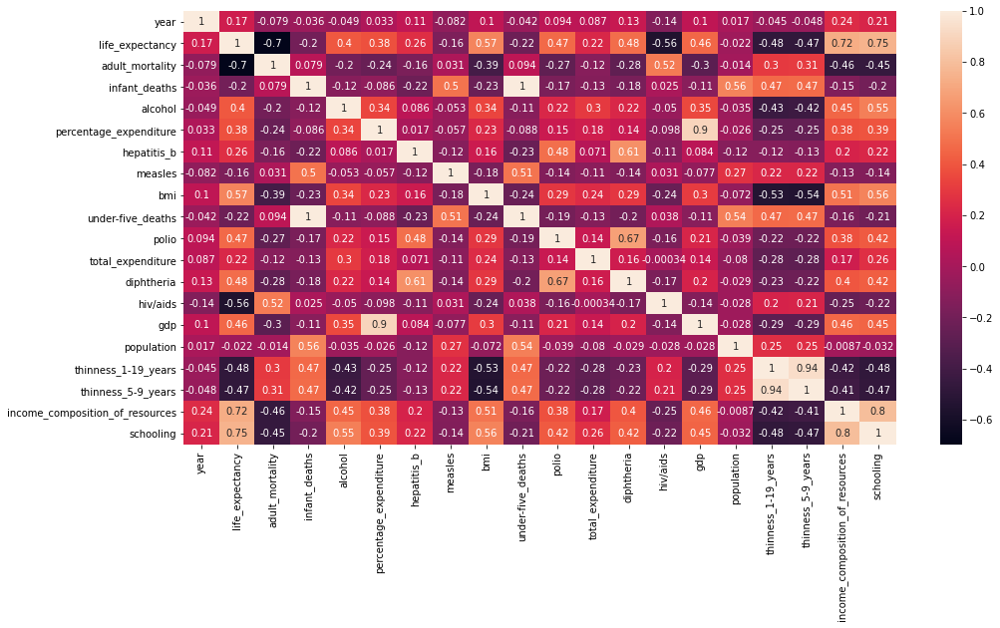

In [16]:
plt.figure(figsize=(16,8))
sns.heatmap(df.corr(), annot=True)

**Life expectancy column has some correlation with the BMI column. So we will fill the null values in BMI column based on life expectancy**

In [17]:
avg_bmi = df.groupby(by='life_expectancy').mean()['bmi']
avg_bmi

life_expectancy
36.3    44.200000
39.0    17.200000
41.0    17.500000
41.5    18.400000
42.3    18.800000
43.1    14.100000
43.3    19.200000
43.5    14.400000
43.8    16.800000
44.0    14.800000
44.3    23.400000
44.5    27.050000
44.6    19.933333
44.8    26.600000
45.1    15.500000
45.3    16.800000
45.4    27.900000
45.5    21.850000
45.6    20.466667
45.7    17.066667
45.9    22.650000
46.0    23.360000
46.2    15.500000
46.3    18.600000
46.4    25.450000
46.5    16.300000
46.6    20.600000
46.7     3.500000
46.8    17.900000
47.1    19.560000
47.4    17.500000
47.6    16.650000
47.7    12.925000
47.8    26.440000
47.9    18.700000
48.0    11.633333
48.1    22.080000
48.2    22.966667
48.3    13.200000
48.4    20.350000
48.5    16.550000
48.6    16.300000
48.7    20.700000
48.8    13.600000
48.9    22.200000
49.0    16.500000
49.1    19.800000
49.2    12.500000
49.3    21.650000
49.4    22.633333
49.5    16.900000
49.6    11.733333
49.7    22.700000
49.8    13.875000
49.9    22.4

In [18]:
def fill_BMI(life_expectancy, BMI):
    if np.isnan(BMI):
        return avg_bmi[life_expectancy]
    else:
        return BMI

In [19]:
df['bmi'] = df.apply(lambda x: fill_BMI(x['life_expectancy'], x['bmi']), axis=1)

In [20]:
grouped_df = df.groupby(by='country').mean()
grouped_df

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling
country,,,,,,,,,,,,,,,,,,,,
Afghanistan,2007.5,58.19375,269.0625,78.2500,0.014375,34.960110,64.562500,2362.2500,15.518750,107.5625,48.375000,8.252500,52.312500,0.10000,340.015425,9.972260e+06,16.58125,15.58125,0.415375,8.21250
Albania,2007.5,75.15625,45.0625,0.6875,4.848750,193.259091,98.000000,53.3750,49.068750,0.9375,98.125000,5.945625,98.062500,0.10000,2119.726679,6.969116e+05,1.61875,1.70000,0.709875,12.13750
Algeria,2007.5,73.61875,108.1875,20.3125,0.406667,236.185241,78.000000,1943.8750,48.743750,23.5000,91.750000,4.604000,91.875000,0.10000,2847.853392,2.164983e+07,6.09375,5.97500,0.694875,12.71250
Angola,2007.5,49.01875,328.5625,83.7500,5.740667,102.100268,70.222222,3561.3125,18.018750,132.6250,46.125000,3.919333,47.687500,2.36875,1975.143045,1.014710e+07,6.19375,6.66875,0.458375,8.04375
Antigua and Barbuda,2007.5,75.05625,127.5000,0.0000,7.949333,1001.585226,98.266667,0.0000,38.425000,0.0000,96.937500,4.791333,98.312500,0.12500,9759.305728,NaN,3.42500,3.37500,0.488625,8.84375
Argentina,2007.5,75.15625,106.0000,10.1250,7.966667,773.038981,81.285714,2.0000,54.981250,11.3750,93.375000,6.912667,92.375000,0.10000,6998.575103,2.012120e+07,1.07500,0.95000,0.794125,16.50625
Armenia,2007.5,73.40000,117.3750,1.0000,3.702667,131.007419,87.562500,274.2500,44.706250,1.0000,89.125000,4.861333,87.375000,0.10000,1999.986318,1.015165e+06,2.03750,2.11250,0.698375,11.78750
Australia,2007.5,81.81250,63.1875,1.0000,10.155333,5332.226473,93.400000,103.9375,55.862500,1.3750,86.750000,8.836667,86.875000,0.10000,34637.565047,4.587010e+06,0.66875,0.62500,0.918125,20.03750
Austria,2007.5,81.48125,65.7500,0.0000,12.236000,4928.439188,81.062500,77.2500,48.287500,0.0000,86.000000,4.715333,86.750000,0.10000,33827.476309,6.474880e+06,1.73125,1.93750,0.862375,15.38750


**We will fill the null values in alcohol column with median value**

In [21]:
df['alcohol'] = df['alcohol'].fillna(df['alcohol'].median())

**We will fill the null values in hepatitis_b column based on the mean value of corresponding countires**

In [22]:
df[['country', 'hepatitis_b']]

,country,hepatitis_b
0,Afghanistan,65.0
1,Afghanistan,62.0
2,Afghanistan,64.0
3,Afghanistan,67.0
4,Afghanistan,68.0
5,Afghanistan,66.0
6,Afghanistan,63.0
7,Afghanistan,64.0
8,Afghanistan,63.0
9,Afghanistan,64.0


In [23]:
avg_hepatitis_b = df.groupby(by='country').mean()['hepatitis_b']
avg_hepatitis_b

country
Afghanistan                                             64.562500
Albania                                                 98.000000
Algeria                                                 78.000000
Angola                                                  70.222222
Antigua and Barbuda                                     98.266667
Argentina                                               81.285714
Armenia                                                 87.562500
Australia                                               93.400000
Austria                                                 81.062500
Azerbaijan                                              59.214286
Bahamas                                                 83.600000
Bahrain                                                 98.125000
Bangladesh                                              77.615385
Barbados                                                84.066667
Belarus                                                 88.937500
Be

In [24]:
def fill_hepatitis(country, hepatitis):
    if np.isnan(hepatitis):
        return avg_hepatitis_b[country]
    else:
        return hepatitis

In [25]:
df['hepatitis_b'] = df.apply(lambda x: fill_hepatitis(x['country'], x['hepatitis_b']), axis=1)

**Remaining missing values will be filled by the median value**

In [26]:
df['hepatitis_b'] = df['hepatitis_b'].fillna(df['hepatitis_b'].median())

**We will fill the null values in hepatitis_b column based on the mean value of corresponding countires**

In [27]:
df[['country', 'total_expenditure']]

,country,total_expenditure
0,Afghanistan,8.16
1,Afghanistan,8.18
2,Afghanistan,8.13
3,Afghanistan,8.52
4,Afghanistan,7.87
5,Afghanistan,9.20
6,Afghanistan,9.42
7,Afghanistan,8.33
8,Afghanistan,6.73
9,Afghanistan,7.43


In [28]:
avg_total_expenditure = df.groupby(by='country').mean()['total_expenditure']
avg_total_expenditure

country
Afghanistan                                              8.252500
Albania                                                  5.945625
Algeria                                                  4.604000
Angola                                                   3.919333
Antigua and Barbuda                                      4.791333
Argentina                                                6.912667
Armenia                                                  4.861333
Australia                                                8.836667
Austria                                                  4.715333
Azerbaijan                                               5.679333
Bahamas                                                  6.706000
Bahrain                                                  3.807333
Bangladesh                                               2.854667
Barbados                                                 6.122000
Belarus                                                  6.192000
Be

In [29]:
def fill_total_expenditure(country, total_expenditure):
    if np.isnan(total_expenditure):
        return avg_total_expenditure[country]
    else:
        return total_expenditure

In [30]:
df['total_expenditure'] = df.apply(lambda x: fill_total_expenditure(x['country'], x['total_expenditure']), axis=1)

**Remaining missing values will be filled by the median value**

In [31]:
df['total_expenditure'] = df['total_expenditure'].fillna(df['total_expenditure'].median())

**GDP column has a high correlation with percentage expenditure column. We will fill the missing GDP values based on the percentage_expenditure values of corresponding countries**

In [32]:
df[['country', 'percentage_expenditure', 'gdp']]

,country,percentage_expenditure,gdp
0,Afghanistan,71.279624,584.259210
1,Afghanistan,73.523582,612.696514
2,Afghanistan,73.219243,631.744976
3,Afghanistan,78.184215,669.959000
4,Afghanistan,7.097109,63.537231
5,Afghanistan,79.679367,553.328940
6,Afghanistan,56.762217,445.893298
7,Afghanistan,25.873925,373.361116
8,Afghanistan,10.910156,369.835796
9,Afghanistan,17.171518,272.563770


**First we will fill the zero values in percentage_expenditure column based on the median value according to status of the country**

In [33]:
percentage_expenditure_median = df.pivot_table(values='percentage_expenditure', columns='status', aggfunc=(lambda x: x.median()))
percentage_expenditure_median

status,Developed,Developing
percentage_expenditure,846.615644,48.900071


In [34]:
def fill_zeros(status, percentage_expenditure):
    if status == 'Developed' and percentage_expenditure == 0:
        return 846.615644
    elif status == 'Developing' and percentage_expenditure == 0:
        return 48.900071
    else:
        return percentage_expenditure

In [35]:
df['percentage_expenditure'] = df.apply(lambda x: fill_zeros(x['status'], x['percentage_expenditure']), axis=1)

In [36]:
avg_gdp = df.groupby(by='percentage_expenditure').mean()['gdp']
avg_gdp

percentage_expenditure
0.099872             1.681350
0.108056             8.376432
0.275648            27.564826
0.328418             3.685949
0.358651            26.371428
0.388254            21.569654
0.397229             4.613575
0.442802            25.448414
0.530573            41.451000
0.661540             5.668726
0.667515            14.142268
0.675683            42.764743
0.681686            43.979713
0.697216            16.639990
0.703132            21.768798
0.735940            28.196949
0.796916            53.127719
0.844186            19.317765
0.868708            39.486749
0.901149            11.553196
0.948526            67.751883
0.962497            12.989164
1.020072            11.631377
1.040021            65.824121
1.041916            14.214412
1.088331            11.336780
1.099666            33.424498
1.117811            77.625783
1.132767            64.729530
1.142004            17.815972
1.177478            12.566464
1.186228            12.178928
1.321464         

In [37]:
def fill_gdp(percentage_expenditure, gdp):
    if np.isnan(gdp):
        return avg_gdp[percentage_expenditure]
    else:
        return gdp

In [38]:
df['gdp'] = df.apply(lambda x: fill_gdp(x['percentage_expenditure'], x['gdp']), axis=1)

**We will fill the missing population values with median value of the column**

In [39]:
df[['country', 'population']]

,country,population
0,Afghanistan,3.373649e+07
1,Afghanistan,3.275820e+05
2,Afghanistan,3.173169e+07
3,Afghanistan,3.696958e+06
4,Afghanistan,2.978599e+06
5,Afghanistan,2.883167e+06
6,Afghanistan,2.843310e+05
7,Afghanistan,2.729431e+06
8,Afghanistan,2.661679e+07
9,Afghanistan,2.589345e+06


In [40]:
df['population'] = df['population'].fillna(df['population'].median())

**We will fill the missing thinness_1-19_years values with the median value**

In [41]:
df[['country', 'thinness_1-19_years']]

,country,thinness_1-19_years
0,Afghanistan,17.2
1,Afghanistan,17.5
2,Afghanistan,17.7
3,Afghanistan,17.9
4,Afghanistan,18.2
5,Afghanistan,18.4
6,Afghanistan,18.6
7,Afghanistan,18.8
8,Afghanistan,19.0
9,Afghanistan,19.2


In [42]:
df['thinness_1-19_years'] = df['thinness_1-19_years'].fillna(df['thinness_1-19_years'].median())

**We will fill the missing thinness_5-9_years values with the median value**

In [43]:
df['thinness_5-9_years'] = df['thinness_5-9_years'].fillna(df['thinness_5-9_years'].median())

**We will fill missing schooling values based on mean value corresponding to life_expectancy**

In [44]:
avg_schooling = df.groupby(by='life_expectancy').mean()['schooling']
avg_schooling

life_expectancy
36.3     8.600000
39.0     6.700000
41.0     7.000000
41.5     7.400000
42.3     7.600000
43.1    10.700000
43.3     7.800000
43.5    10.100000
43.8     9.600000
44.0    10.400000
44.3     8.600000
44.5    10.100000
44.6     9.800000
44.8    10.350000
45.1    10.000000
45.3     7.440000
45.4     9.500000
45.5    10.250000
45.6     6.700000
45.7     5.466667
45.9     7.500000
46.0     9.260000
46.2     9.450000
46.3     6.000000
46.4    10.400000
46.5     5.500000
46.6     9.700000
46.7    11.800000
46.8     6.050000
47.1     8.280000
47.4     7.400000
47.6     5.500000
47.7     8.566667
47.8    10.650000
47.9    10.500000
48.0     6.050000
48.1     8.640000
48.2     8.700000
48.3     6.600000
48.4     7.400000
48.5     7.325000
48.6     6.366667
48.7     8.100000
48.8    11.000000
48.9     4.450000
49.0     5.400000
49.1     8.500000
49.2     7.750000
49.3    10.150000
49.4     8.250000
49.5     5.800000
49.6     5.000000
49.7     9.100000
49.8     6.600000
49.9     7.1

In [45]:
def fill_schooling(life_expectancy, schooling):
    if np.isnan(schooling):
        return avg_schooling[life_expectancy]
    else:
        return schooling

In [46]:
df['schooling'] = df.apply(lambda x: fill_schooling(x['life_expectancy'], x['schooling']), axis=1)

**We will fill the missing income_composition_of_resources with mean value corresonding to their life expectancy**

In [47]:
avg_income_composition_of_resources = df.groupby(by='life_expectancy').mean()['income_composition_of_resources']
avg_income_composition_of_resources

life_expectancy
36.3    0.470000
39.0    0.292000
41.0    0.302000
41.5    0.322000
42.3    0.332000
43.1    0.391000
43.3    0.341000
43.5    0.387000
43.8    0.418000
44.0    0.388000
44.3    0.377500
44.5    0.427500
44.6    0.397333
44.8    0.433000
45.1    0.366000
45.3    0.320600
45.4    0.408000
45.5    0.436500
45.6    0.373667
45.7    0.340667
45.9    0.406000
46.0    0.434000
46.2    0.403500
46.3    0.323000
46.4    0.489500
46.5    0.401000
46.6    0.398000
46.7    0.560000
46.8    0.368000
47.1    0.334600
47.4    0.213000
47.6    0.169000
47.7    0.278333
47.8    0.487750
47.9    0.456000
48.0    0.303000
48.1    0.338600
48.2    0.437500
48.3    0.318000
48.4    0.400000
48.5    0.359000
48.6    0.327667
48.7    0.468000
48.8    0.404000
48.9    0.196000
49.0    0.291000
49.1    0.480000
49.2    0.407500
49.3    0.456000
49.4    0.379500
49.5    0.298000
49.6    0.275333
49.7    0.401000
49.8    0.357250
49.9    0.370000
50.0    0.390600
51.0    0.277000
51.1    0.49350

In [48]:
def fill_income_composition(life_expectancy, income_composition):
    if np.isnan(income_composition):
        return avg_income_composition_of_resources[life_expectancy]
    else:
        return income_composition

In [49]:
df['income_composition_of_resources'] = df.apply(lambda x: fill_income_composition(x['life_expectancy'], x['income_composition_of_resources']), axis=1)

In [50]:
df.isnull().sum() / len(df) *100

country                            0.000000
year                               0.000000
status                             0.000000
life_expectancy                    0.000000
adult_mortality                    0.000000
infant_deaths                      0.000000
alcohol                            0.000000
percentage_expenditure             0.000000
hepatitis_b                        0.000000
measles                            0.000000
bmi                                0.000000
under-five_deaths                  0.000000
polio                              0.648907
total_expenditure                  0.000000
diphtheria                         0.648907
hiv/aids                           0.000000
gdp                                0.000000
population                         0.000000
thinness_1-19_years                0.000000
thinness_5-9_years                 0.000000
income_composition_of_resources    0.000000
schooling                          0.000000
dtype: float64

**polio and hiv/aids have less than 1% of missing values. So we will drop them**

In [51]:
df = df.dropna()

In [52]:
df.head()

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


## Handling outliers

In [53]:
df.columns

Index(['country', 'year', 'status', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness_1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'schooling'],
      dtype='object')

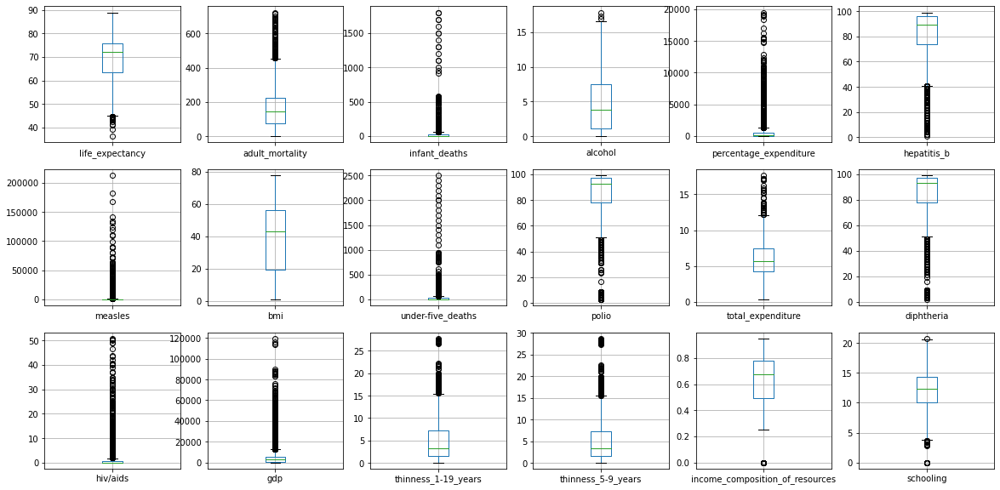

In [54]:
plt.figure(figsize=(20,10))
for i, col in enumerate(['life_expectancy', 'adult_mortality',
       'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'thinness_1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'schooling'], start=1):
    plt.subplot(3,6,i)
    df.boxplot(col)

### Number of outliers

In [55]:
def count_outliers(col, data=df):    
    print(col)
    Q1 = np.percentile(data[col], 25)
    Q3 = np.percentile(data[col], 75)
    IQR = Q3-Q1
    
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    
    outlier_count = len(np.where((data[col] > upper_bound) | (data[col] < lower_bound))[0])
    outlier_percentage = outlier_count / len(data[col]) * 100
    print('Number of outliers:', outlier_count)
    print('Percentage of outliers:', outlier_percentage, '%')
    print('\n')

In [56]:
for col in list(df.columns[3:]):
    count_outliers(col)

life_expectancy
Number of outliers: 17
Percentage of outliers: 0.5843932622894465 %


adult_mortality
Number of outliers: 86
Percentage of outliers: 2.956342385699553 %


infant_deaths
Number of outliers: 315
Percentage of outliers: 10.828463389480921 %


alcohol
Number of outliers: 3
Percentage of outliers: 0.10312822275696115 %


percentage_expenditure
Number of outliers: 349
Percentage of outliers: 11.997249914059815 %


hepatitis_b
Number of outliers: 262
Percentage of outliers: 9.006531454107941 %


measles
Number of outliers: 535
Percentage of outliers: 18.391199724991406 %


bmi
Number of outliers: 0
Percentage of outliers: 0.0 %


under-five_deaths
Number of outliers: 406
Percentage of outliers: 13.956686146442078 %


polio
Number of outliers: 278
Percentage of outliers: 9.556548642145067 %


total_expenditure
Number of outliers: 34
Percentage of outliers: 1.168786524578893 %


diphtheria
Number of outliers: 297
Percentage of outliers: 10.209694052939154 %


hiv/aids
Number of 

In [57]:
from scipy.stats.mstats import winsorize

Text(0.5, 1.0, 'winsorized_life_expectancy')

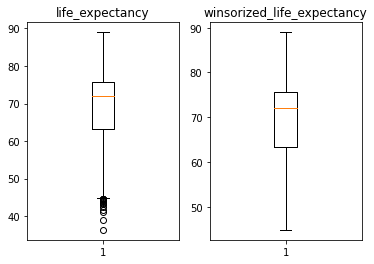

In [58]:
## life_expectancy ##
plt.subplot(1,2,1)
life_expectancy = df['life_expectancy']
plt.boxplot(life_expectancy)
plt.title('life_expectancy')

plt.subplot(1,2,2)
winsorized_life_expectancy = winsorize(df['life_expectancy'], (0.006,0)) 
plt.boxplot(winsorized_life_expectancy)
plt.title('winsorized_life_expectancy')

Text(0.5, 1.0, 'winsorized_adult_mortality')

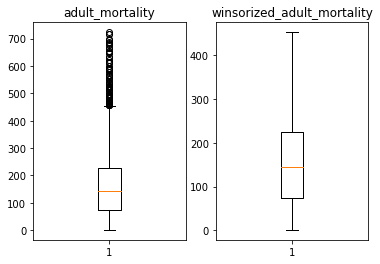

In [59]:
## adult_mortality ##
plt.subplot(1,2,1)
adult_mortality = df['adult_mortality']
plt.boxplot(adult_mortality)
plt.title('adult_mortality')

plt.subplot(1,2,2)
winsorized_adult_mortality = winsorize(df['adult_mortality'], (0,0.03)) 
plt.boxplot(winsorized_adult_mortality)
plt.title('winsorized_adult_mortality')

Text(0.5, 1.0, 'winsorized_infant_deaths')

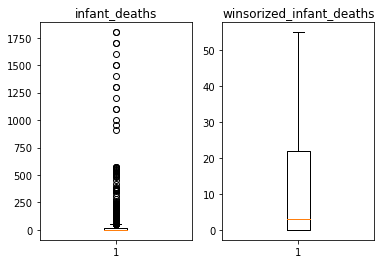

In [60]:
## infant_deaths ##
plt.subplot(1,2,1)
infant_deaths = df['infant_deaths']
plt.boxplot(infant_deaths)
plt.title('infant_deaths')

plt.subplot(1,2,2)
winsorized_infant_deaths = winsorize(df['infant_deaths'], (0,0.11)) 
plt.boxplot(winsorized_infant_deaths)
plt.title('winsorized_infant_deaths')

Text(0.5, 1.0, 'winsorized_alcohol')

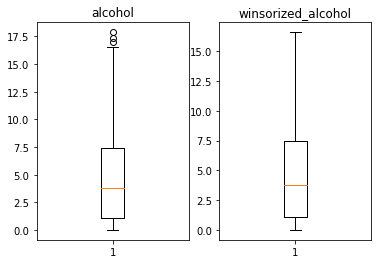

In [61]:
## alcohol ##
plt.subplot(1,2,1)
alcohol = df['alcohol']
plt.boxplot(alcohol)
plt.title('alcohol')

plt.subplot(1,2,2)
winsorized_alcohol = winsorize(df['alcohol'], (0,0.00104)) 
plt.boxplot(winsorized_alcohol)
plt.title('winsorized_alcohol')

Text(0.5, 1.0, 'winsorized_percentage_expenditure')

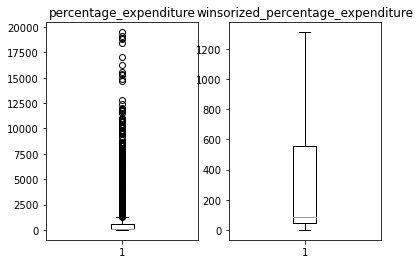

In [62]:
## percentage_expenditure ##
plt.subplot(1,2,1)
percentage_expenditure = df['percentage_expenditure']
plt.boxplot(percentage_expenditure)
plt.title('percentage_expenditure')

plt.subplot(1,2,2)
winsorized_percentage_expenditure = winsorize(df['percentage_expenditure'], (0,0.12)) 
plt.boxplot(winsorized_percentage_expenditure)
plt.title('winsorized_percentage_expenditure')

Text(0.5, 1.0, 'winsorized_hepatitis_b')

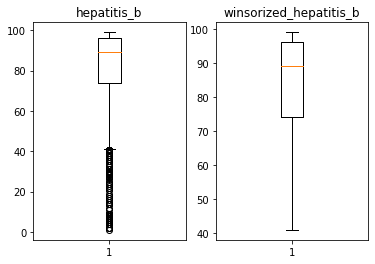

In [63]:
## hepatitis_b ##
plt.subplot(1,2,1)
hepatitis_b = df['hepatitis_b']
plt.boxplot(hepatitis_b)
plt.title('hepatitis_b')

plt.subplot(1,2,2)
winsorized_hepatitis_b = winsorize(df['hepatitis_b'], (0.091,0)) 
plt.boxplot(winsorized_hepatitis_b)
plt.title('winsorized_hepatitis_b')

Text(0.5, 1.0, 'winsorized_measles')

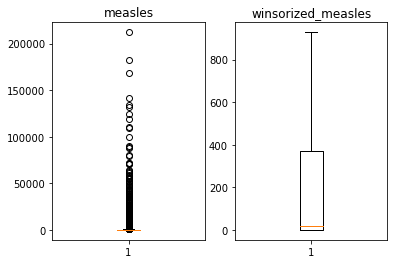

In [64]:
## measles ##
plt.subplot(1,2,1)
measles = df['measles']
plt.boxplot(measles)
plt.title('measles')

plt.subplot(1,2,2)
winsorized_measles = winsorize(df['measles'], (0,0.184)) 
plt.boxplot(winsorized_measles)
plt.title('winsorized_measles')

Text(0.5, 1.0, 'winsorized_under_five_deaths')

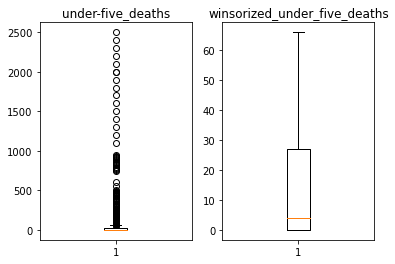

In [65]:
## under-five_deaths ##
plt.subplot(1,2,1)
under_five_deaths = df['under-five_deaths']
plt.boxplot(under_five_deaths)
plt.title('under-five_deaths')

plt.subplot(1,2,2)
winsorized_under_five_deaths = winsorize(df['under-five_deaths'], (0,0.14)) 
plt.boxplot(winsorized_under_five_deaths)
plt.title('winsorized_under_five_deaths')

Text(0.5, 1.0, 'winsorized_polio')

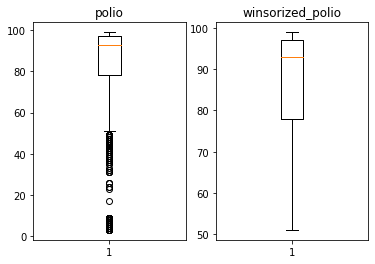

In [66]:
## polio ##
plt.subplot(1,2,1)
polio = df['polio']
plt.boxplot(polio)
plt.title('polio')

plt.subplot(1,2,2)
winsorized_polio = winsorize(df['polio'], (0.0956,0)) 
plt.boxplot(winsorized_polio)
plt.title('winsorized_polio')

Text(0.5, 1.0, 'winsorized_total_expenditure')

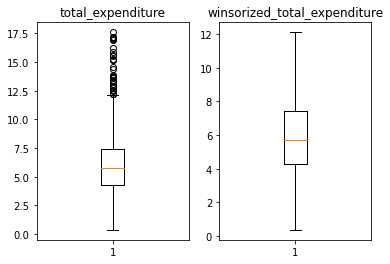

In [67]:
## total_expenditure ##
plt.subplot(1,2,1)
total_expenditure = df['total_expenditure']
plt.boxplot(total_expenditure)
plt.title('total_expenditure')

plt.subplot(1,2,2)
winsorized_total_expenditure = winsorize(df['total_expenditure'], (0,0.0117)) 
plt.boxplot(winsorized_total_expenditure)
plt.title('winsorized_total_expenditure')

Text(0.5, 1.0, 'winsorized_diphtheria')

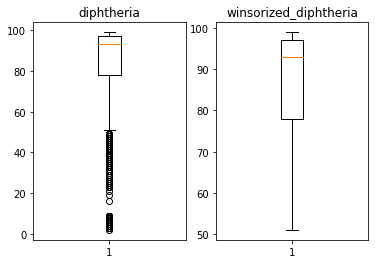

In [68]:
## diphtheria ##
plt.subplot(1,2,1)
diphtheria = df['diphtheria']
plt.boxplot(diphtheria)
plt.title('diphtheria')

plt.subplot(1,2,2)
winsorized_diphtheria = winsorize(df['diphtheria'], (0.1021,0)) 
plt.boxplot(winsorized_diphtheria)
plt.title('winsorized_diphtheria')

Text(0.5, 1.0, 'winsorized_hiv/aids')

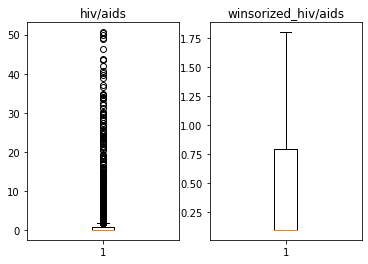

In [69]:
## hiv/aids ##
plt.subplot(1,2,1)
hiv_aids = df['hiv/aids']
plt.boxplot(hiv_aids)
plt.title('hiv/aids')

plt.subplot(1,2,2)
winsorized_hiv_aids = winsorize(df['hiv/aids'], (0,0.1826)) 
plt.boxplot(winsorized_hiv_aids)
plt.title('winsorized_hiv/aids')

Text(0.5, 1.0, 'winsorized_gdp')

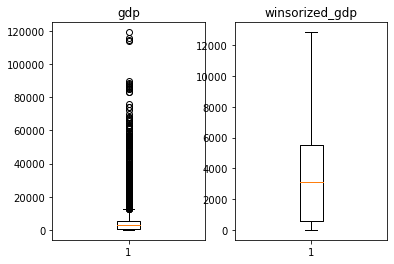

In [70]:
## gdp ##
plt.subplot(1,2,1)
gdp = df['gdp']
plt.boxplot(gdp)
plt.title('gdp')

plt.subplot(1,2,2)
winsorized_gdp = winsorize(df['gdp'], (0,0.1571)) 
plt.boxplot(winsorized_gdp)
plt.title('winsorized_gdp')

Text(0.5, 1.0, 'winsorized_population')

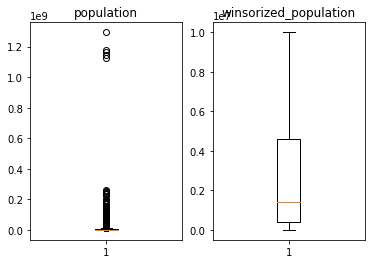

In [71]:
## population ##
plt.subplot(1,2,1)
population = df['population']
plt.boxplot(population)
plt.title('population')

plt.subplot(1,2,2)
winsorized_population = winsorize(df['population'], (0,0.1554)) 
plt.boxplot(winsorized_population)
plt.title('winsorized_population')

Text(0.5, 1.0, 'winsorized_thinness_1-19_years')

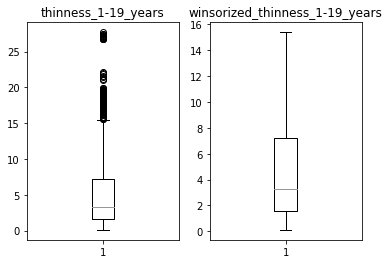

In [72]:
## thinness_1_19_years ##
plt.subplot(1,2,1)
thinness_1_19_years = df['thinness_1-19_years']
plt.boxplot(thinness_1_19_years)
plt.title('thinness_1-19_years')

plt.subplot(1,2,2)
winsorized_thinness_1_19_years = winsorize(df['thinness_1-19_years'], (0,0.0306)) 
plt.boxplot(winsorized_thinness_1_19_years)
plt.title('winsorized_thinness_1-19_years')

Text(0.5, 1.0, 'winsorized_thinness_5-9_years')

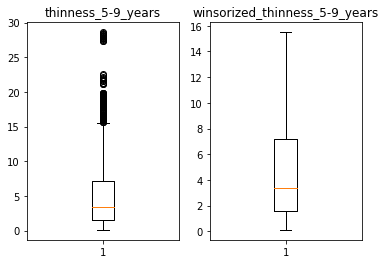

In [73]:
## thinness_5-9_years ##
plt.subplot(1,2,1)
thinness_5_9_years = df['thinness_5-9_years']
plt.boxplot(thinness_5_9_years)
plt.title('thinness_5-9_years')

plt.subplot(1,2,2)
winsorized_thinness_5_9_years = winsorize(df['thinness_5-9_years'], (0,0.0341)) 
plt.boxplot(winsorized_thinness_5_9_years)
plt.title('winsorized_thinness_5-9_years')

Text(0.5, 1.0, 'winsorized_income_composition_of_resources')

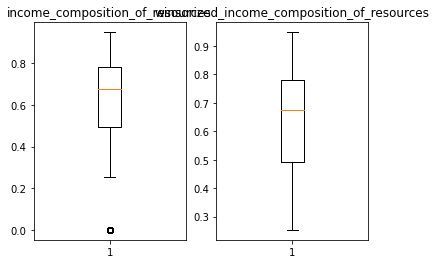

In [74]:
## income_composition_of_resources ##
plt.subplot(1,2,1)
income_composition_of_resources = df['income_composition_of_resources']
plt.boxplot(income_composition_of_resources)
plt.title('income_composition_of_resources')

plt.subplot(1,2,2)
winsorized_income_composition_of_resources = winsorize(df['income_composition_of_resources'], (0.0392,0)) 
plt.boxplot(winsorized_income_composition_of_resources)
plt.title('winsorized_income_composition_of_resources')

Text(0.5, 1.0, 'winsorized_schooling')

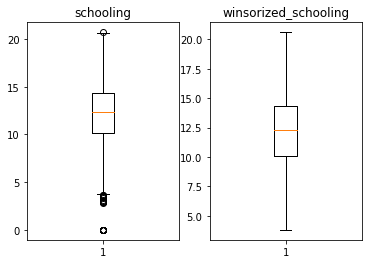

In [75]:
## schooling ##
plt.subplot(1,2,1)
schooling = df['schooling']
plt.boxplot(schooling)
plt.title('schooling')

plt.subplot(1,2,2)
winsorized_schooling = winsorize(df['schooling'], (0.009,0.0005)) 
plt.boxplot(winsorized_schooling)
plt.title('winsorized_schooling')

In [76]:
df['winsorized_Life_Expectancy'] = winsorized_life_expectancy
df['winsorized_Adult_Mortality'] = winsorized_adult_mortality
df['winsorized_Infant_Deaths'] = winsorized_infant_deaths
df['winsorized_Alcohol'] = winsorized_alcohol
df['winsorized_Percentage_Exp'] = winsorized_percentage_expenditure
df['winsorized_HepatitisB'] = winsorized_hepatitis_b
df['winsorized_Under_Five_Deaths'] = winsorized_under_five_deaths
df['winsorized_Polio'] = winsorized_polio
df['winsorized_Tot_Exp'] = winsorized_total_expenditure
df['winsorized_Diphtheria'] = winsorized_diphtheria
df['winsorized_HIV'] = winsorized_hiv_aids
df['winsorized_GDP'] = winsorized_gdp
df['winsorized_thinness_1-19_years'] = winsorized_thinness_1_19_years
df['winsorized_thinness_5-9_years'] = winsorized_thinness_5_9_years
df['winsorized_Income_Comp_Of_Resources'] = winsorized_income_composition_of_resources
df['winsorized_Schooling'] = winsorized_schooling

In [77]:
df.columns

Index(['country', 'year', 'status', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness_1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'schooling',
       'winsorized_Life_Expectancy', 'winsorized_Adult_Mortality',
       'winsorized_Infant_Deaths', 'winsorized_Alcohol',
       'winsorized_Percentage_Exp', 'winsorized_HepatitisB',
       'winsorized_Under_Five_Deaths', 'winsorized_Polio',
       'winsorized_Tot_Exp', 'winsorized_Diphtheria', 'winsorized_HIV',
       'winsorized_GDP', 'winsorized_thinness_1-19_years',
       'winsorized_thinness_5-9_years', 'winsorized_Income_Comp_Of_Resources',
       'winsorized_Schooling'],
      dtype='object')

In [78]:
col = df.columns[22:]
col

Index(['winsorized_Life_Expectancy', 'winsorized_Adult_Mortality',
       'winsorized_Infant_Deaths', 'winsorized_Alcohol',
       'winsorized_Percentage_Exp', 'winsorized_HepatitisB',
       'winsorized_Under_Five_Deaths', 'winsorized_Polio',
       'winsorized_Tot_Exp', 'winsorized_Diphtheria', 'winsorized_HIV',
       'winsorized_GDP', 'winsorized_thinness_1-19_years',
       'winsorized_thinness_5-9_years', 'winsorized_Income_Comp_Of_Resources',
       'winsorized_Schooling'],
      dtype='object')

In [79]:
winsorized_df = df[col]

In [80]:
winsorized_df['country'] = df['country']
winsorized_df['status'] = df['status']
winsorized_df['year'] = df['year']

<ipython-input-80-c20f2305c93e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  winsorized_df['country'] = df['country']
<ipython-input-80-c20f2305c93e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  winsorized_df['status'] = df['status']
<ipython-input-80-c20f2305c93e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

In [81]:
winsorized_df.head()

,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Exp,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Tot_Exp,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_thinness_1-19_years,winsorized_thinness_5-9_years,winsorized_Income_Comp_Of_Resources,winsorized_Schooling,country,status,year
0,65.0,263.0,55,0.01,71.279624,65.0,66,51.0,8.16,65.0,0.1,584.259210,15.4,15.5,0.479,10.1,Afghanistan,Developing,2015
1,59.9,271.0,55,0.01,73.523582,62.0,66,58.0,8.18,62.0,0.1,612.696514,15.4,15.5,0.476,10.0,Afghanistan,Developing,2014
2,59.9,268.0,55,0.01,73.219243,64.0,66,62.0,8.13,64.0,0.1,631.744976,15.4,15.5,0.470,9.9,Afghanistan,Developing,2013
3,59.5,272.0,55,0.01,78.184215,67.0,66,67.0,8.52,67.0,0.1,669.959000,15.4,15.5,0.463,9.8,Afghanistan,Developing,2012
4,59.2,275.0,55,0.01,7.097109,68.0,66,68.0,7.87,68.0,0.1,63.537231,15.4,15.5,0.454,9.5,Afghanistan,Developing,2011


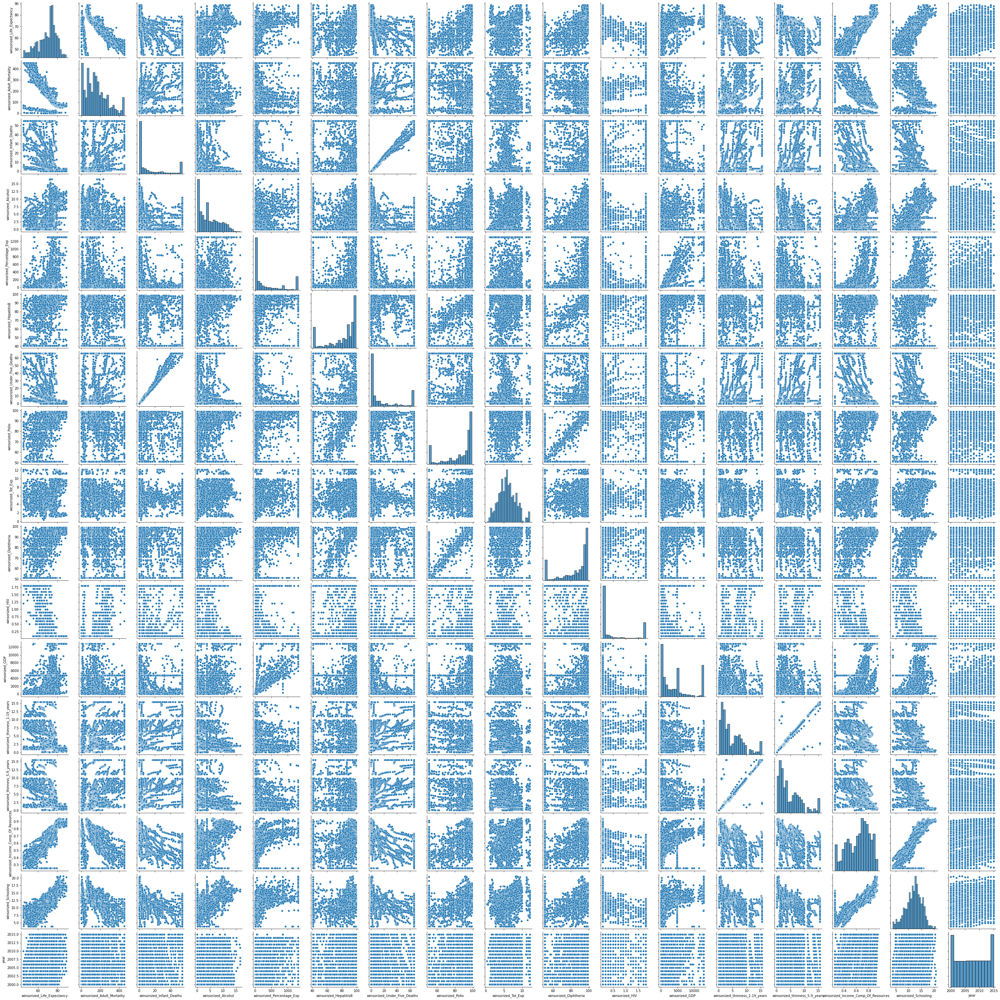

In [82]:
sns.pairplot(winsorized_df)

## One-hot encoding of categorical feature

In [83]:
status = pd.get_dummies(winsorized_df['status'], drop_first=True)
winsorized_df = pd.concat([winsorized_df.drop('status', axis=1), status], axis=1)

In [84]:
winsorized_df.shape

(2909, 19)

<AxesSubplot:>

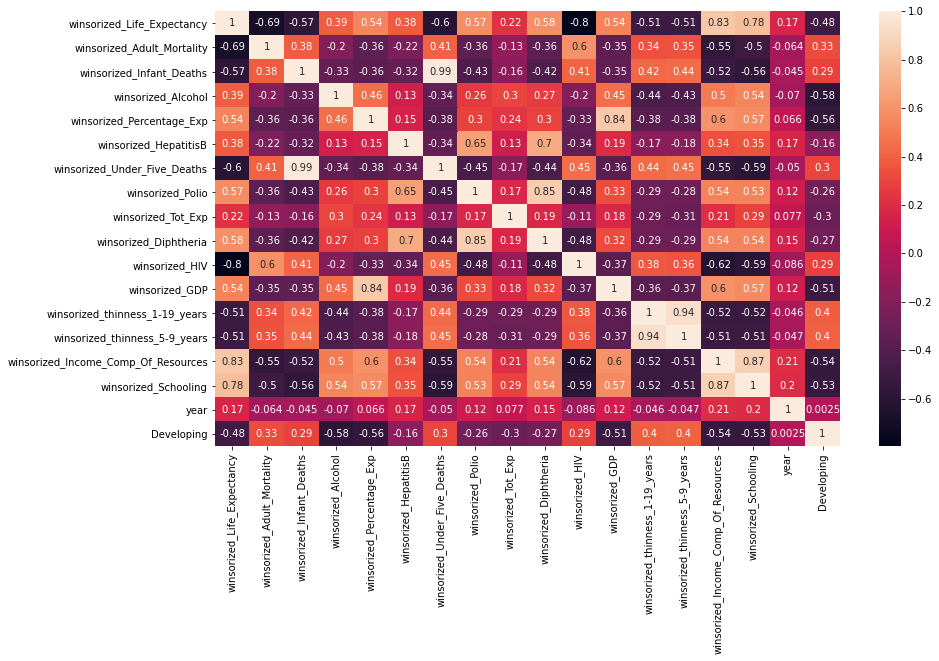

In [85]:
plt.figure(figsize=(14,8))
sns.heatmap(winsorized_df.corr(), annot=True)

winsorized_Under_Five_Deaths and winsorized_Infant_Deaths have almost perfect correlation. We will drop the winsorized_Under_Five_Deaths column. winsorized_thinness_1-19_years and winsorized_thinness_5-9_years have very high correlation. We wil drop the winsorized_thinness_5-9_years column

## Train-test split

In [86]:
X = winsorized_df.drop(['winsorized_Life_Expectancy', 'country'], axis=1)
y = winsorized_df['winsorized_Life_Expectancy']

In [87]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Model building

## Random Forest

In [88]:
from sklearn.ensemble import RandomForestRegressor

In [89]:
rfr = RandomForestRegressor()

In [90]:
rfr.fit(X_train, y_train)

RandomForestRegressor()

In [91]:
from sklearn.metrics import mean_squared_error, r2_score

In [92]:
mean_squared_error(y_test, rfr.predict(X_test))

3.171222158075601

In [93]:
r2_score(y_test, rfr.predict(X_test))

0.9643571770905591

## XGBoost

In [94]:
from xgboost import XGBRegressor

In [95]:
xgbr = XGBRegressor()

In [96]:
xgbr.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [97]:
mean_squared_error(y_test, xgbr.predict(X_test))

3.3019406805360894

In [98]:
r2_score(y_test, xgbr.predict(X_test))

0.9628879715556589

## ExtraTrees

In [99]:
from sklearn.ensemble import ExtraTreesRegressor

In [100]:
etr = ExtraTreesRegressor()

In [101]:
etr.fit(X_train, y_train)

ExtraTreesRegressor()

In [102]:
mean_squared_error(y_test, etr.predict(X_test))

2.243321166666667

In [103]:
r2_score(y_test, etr.predict(X_test))

0.9747862826737369

<AxesSubplot:xlabel='Importance', ylabel='Feature_name'>

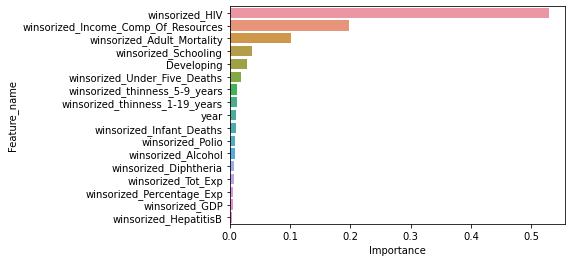

In [112]:
importance_df = pd.DataFrame({'Feature_name':X.columns, 'Importance':etr.feature_importances_})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
sns.barplot(x='Importance', y='Feature_name',data=importance_df, orient='h')

Feature importance of HIV attribute is the highest

## In conclusion we


Loaded the dataset.

Did Exploratory Data Analysis.

Processed the data, dealt with missing values handled outliers using winsorization and did one-hot encoding for categorical features for the winsorized dataset. Also dropped highly correlated features.

Build and trained Random Forest, XGBoost and ExtraTrees regression model.

ExtraTrees model performed best with MSE of 2.24 unit which is less than 5% of mean value of the target column and r2 score of 0.97.